<a href="https://colab.research.google.com/github/EmersonGodoi/Deteccao_Objetos/blob/main/Deteccao_Objetos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

4.8.0
4.8.0
Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Todas as camadas (layers):
('conv_0', 'bn_0', 'mish_1', 'conv_1', 'bn_1', 'mish_2', 'conv_2', 'bn_2', 'mish_3', 'identity_3', 'conv_4', 'bn_4', 'mish_5', 'conv_5', 'bn_5', 'mish_6', 'conv_6', 'bn_6', 'mish_7', 'shortcut_7', 'conv_8', 'bn_8', 'mish_9', 'concat_9', 'conv_10', 'bn_10', 'mish_11', 'conv_11', 'bn_11', 'mish_12', 'conv_12', 'bn_12', 'mish_13', 'identity_13', 'conv_14', 'bn_14', 'mish_15', 'conv_15', 'bn_15', 'mish_16', 'conv_16', 'bn_16', 'mish_17', 'shortcut_17', 'conv_18', 'bn_18', 'mish_19', 'conv_19', 'bn_19', 'mish_20', 'shortcut_20', 'conv_21', 'bn_21', 'mish_22', 'concat_22', 'conv_23', 'bn_23', 'mish_24', 'conv_24', 'bn_24', 'mish_25', 'conv_25', 'bn_25', 'mish_26', 'identity_26', 'conv_27', 'bn_27', 'mish_28', 'conv_28', 'bn_28', 'mish_29', 'conv_29', 'bn_29', 'mish_30', 'shortcut_30', 'conv_31', 'bn_31', 'mish_32', 'conv_32'

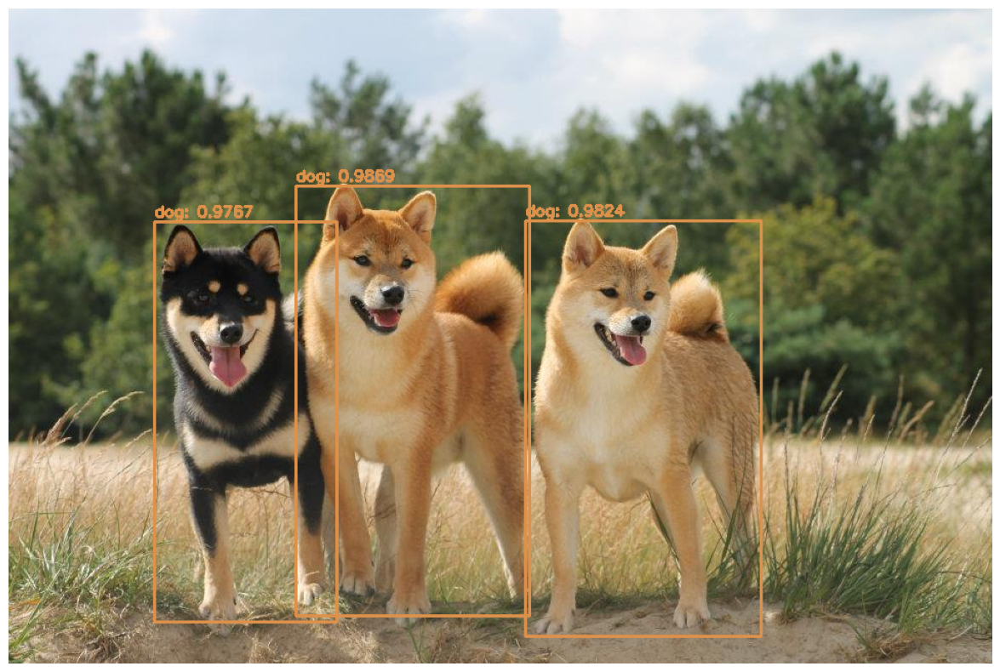

YOLO levou 1.73 segundos
Pessoas detectadas na imagem fotos_teste/gato03.jpg: 0


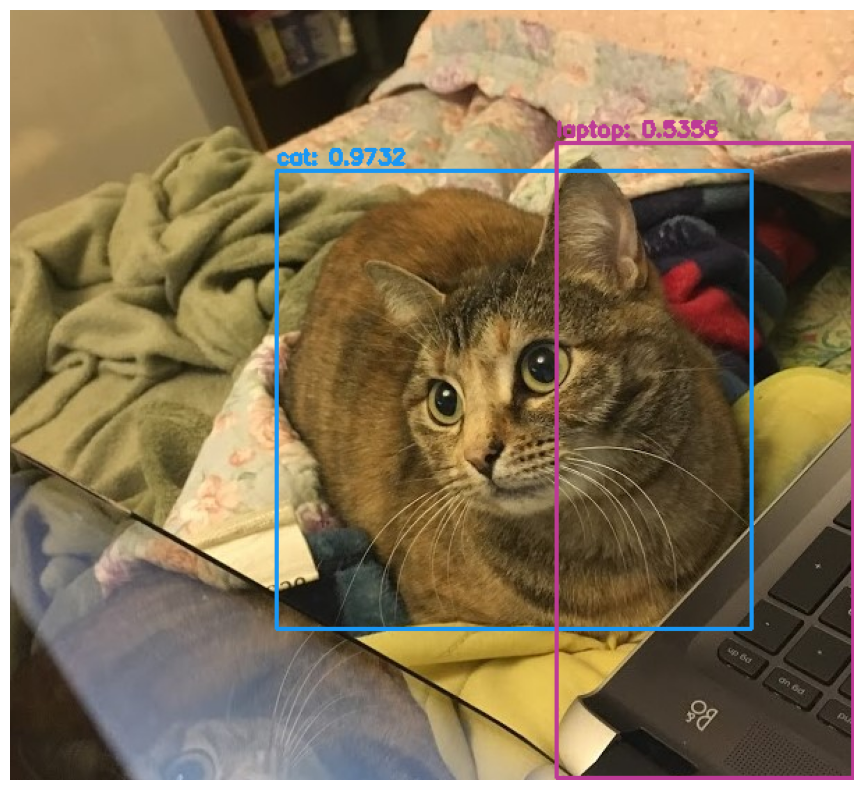

YOLO levou 1.63 segundos
Pessoas detectadas na imagem fotos_teste/gato02.jpg: 0


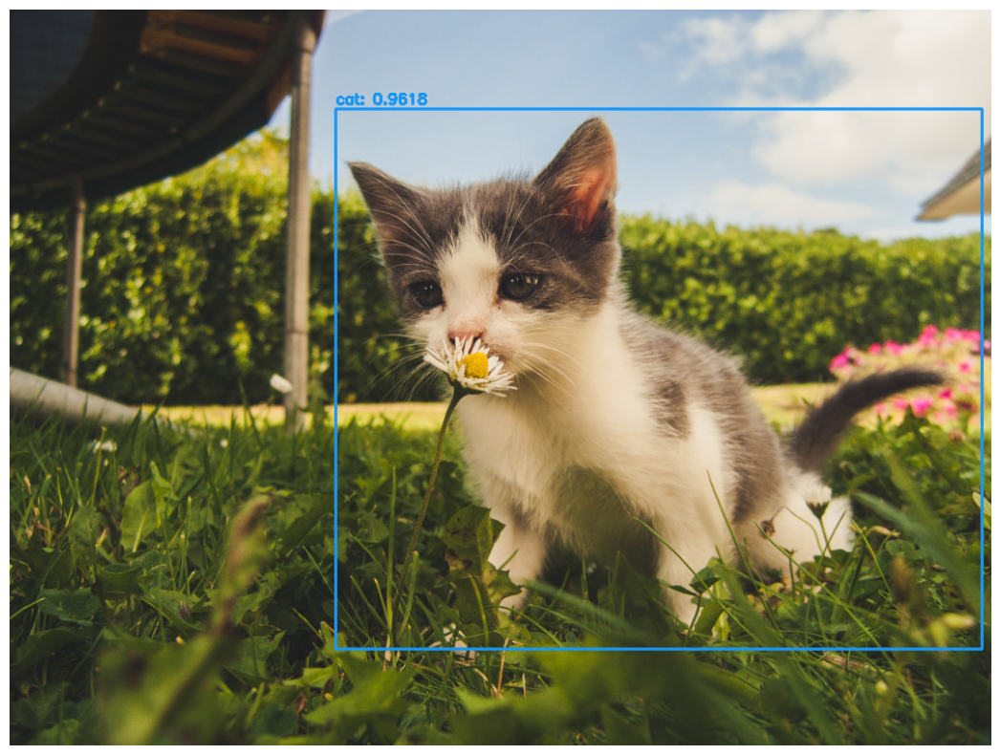

YOLO levou 1.75 segundos
Pessoas detectadas na imagem fotos_teste/dog.jpg: 0


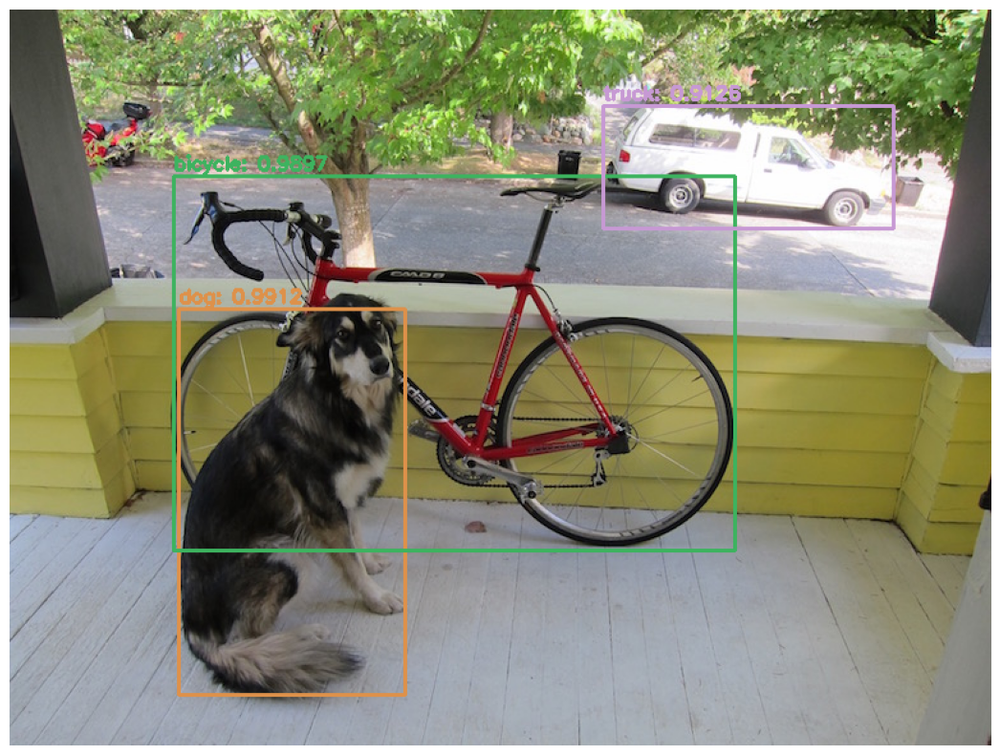

YOLO levou 2.13 segundos
Pessoas detectadas na imagem fotos_teste/img-canecas.jpg: 0


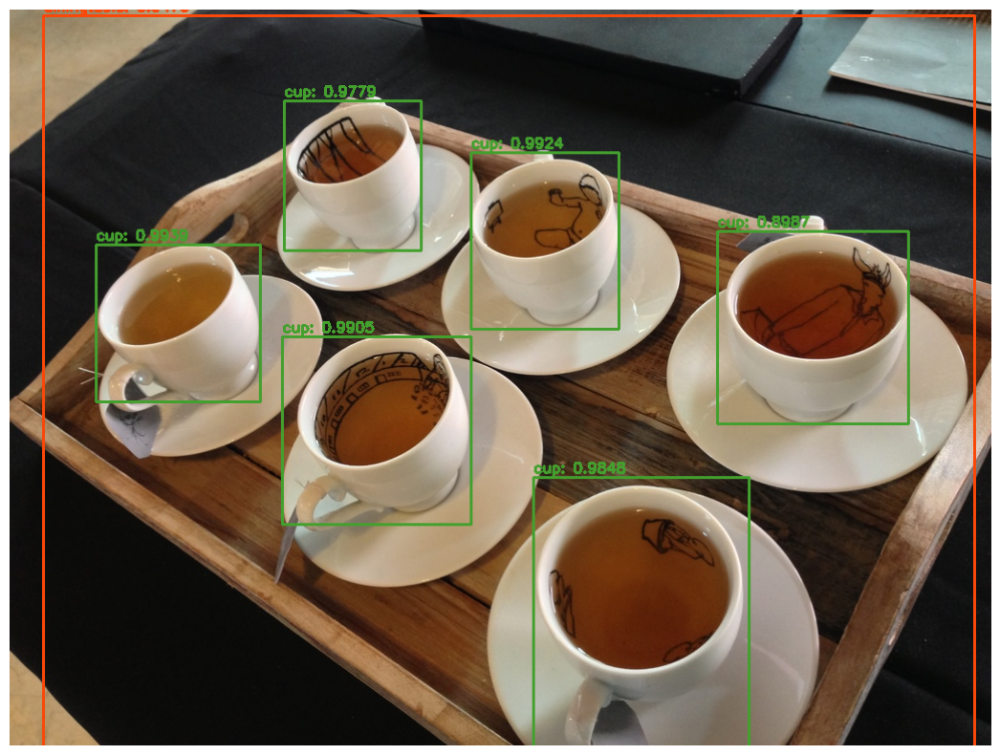

YOLO levou 3.63 segundos
Pessoas detectadas na imagem fotos_teste/person.jpg: 1


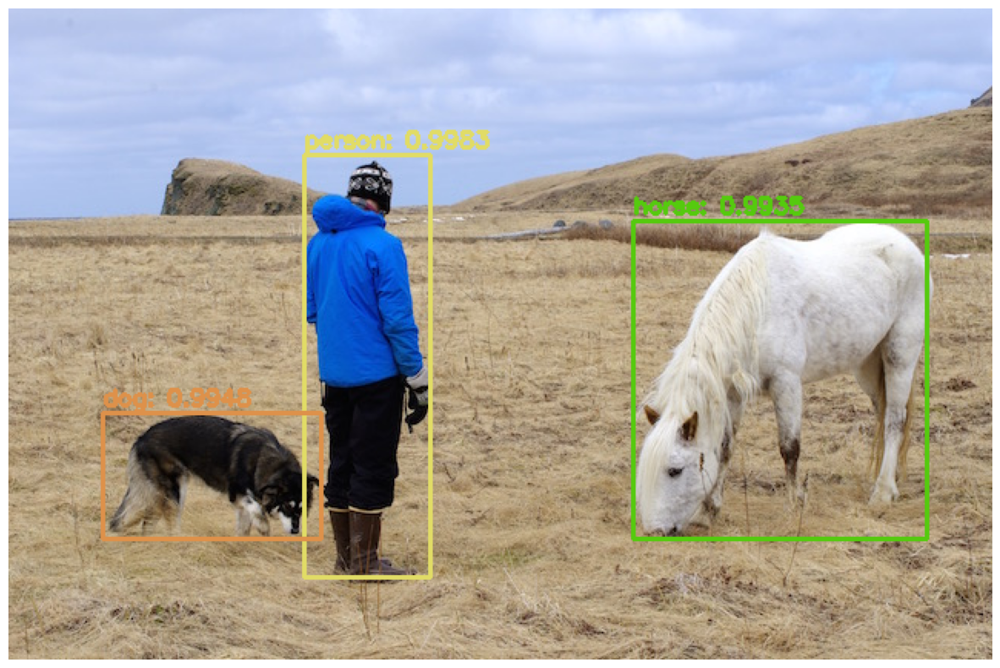

YOLO levou 1.74 segundos
Pessoas detectadas na imagem fotos_teste/cachorros02.jpg: 0


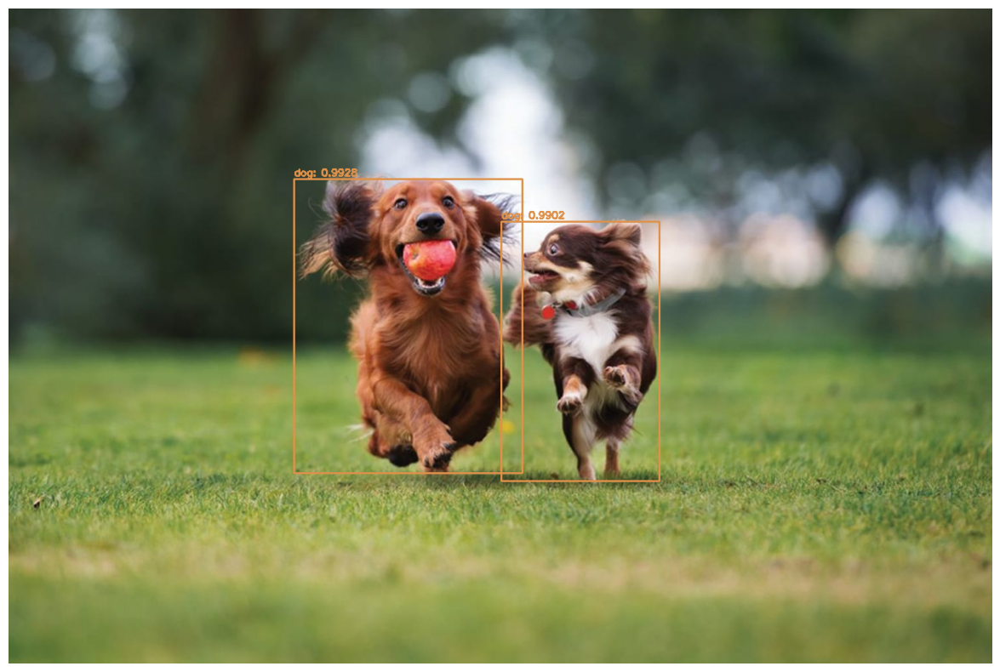

YOLO levou 1.73 segundos
Pessoas detectadas na imagem fotos_teste/gato04.jpg: 0


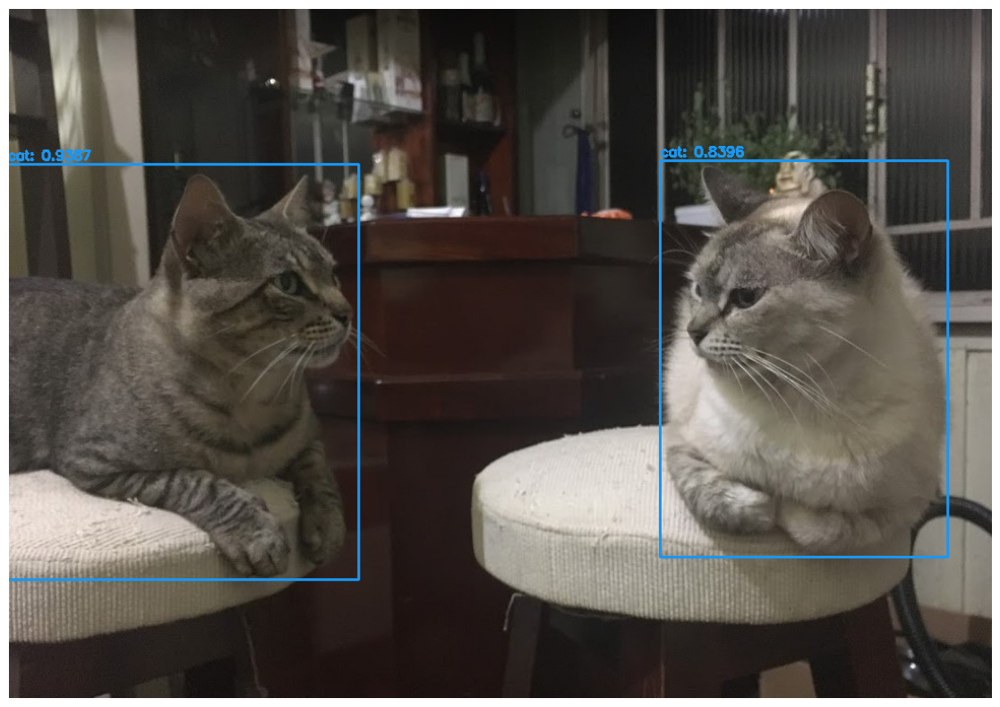

In [ ]:
#Etapa 1 - Importando as bibliotecas
import cv2
print(cv2.__version__)

import cv2
import numpy as np
import time
import os
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import zipfile
print(cv2.__version__)

#Etapa 2 - Conectando com o Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

#Etapa 3 - Carregando os arquivos do modelo treinado
path = '/content/gdrive/MyDrive/Detecção de Objetos com YOLO, Darknet, OpenCV e Python/modelo_YOLOv4.zip'
zip_object = zipfile.ZipFile(file=path, mode="r")
zip_object.extractall("./")
zip_object.close()

labelsPath = os.path.sep.join(['/content/cfg', "coco.names"])
LABELS = open(labelsPath).read().strip().split("\n")

weightsPath = os.path.sep.join(['/content/', "yolov4.weights"])
configPath = os.path.sep.join(['/content/cfg', "yolov4.cfg"])

net = cv2.dnn.readNet(configPath, weightsPath)

#Etapa 4 - Definindo mais configurações para a detecção
np.random.seed(42)
COLORS = np.random.randint(0, 255, size=(len(LABELS), 3), dtype="uint8")

ln = net.getLayerNames()
print("Todas as camadas (layers):")
print(ln)
print("Total: "+ str(len(ln)))
print("Camadas de saída: ")
print(net.getUnconnectedOutLayers())
ln = [ln[i - 1] for i in net.getUnconnectedOutLayers()]
print(ln)

#Etapa 5 - Carregando a imagem onde será feita a detecção
def mostrar(img):
  fig = plt.gcf()
  fig.set_size_inches(16, 10)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show()

imagem = cv2.imread("/content/gdrive/MyDrive/Detecção de Objetos com YOLO, Darknet, OpenCV e Python/imagens/cachorros02.jpg")
#mostrar(imagem)
imagem_cp = imagem.copy()
(H, W) = imagem.shape[:2]
print("Altura: " + str(H) + "\nLargura: " + str(W))

#Etapa 6 - Processando a imagem de entrada
def redimensionar(imagem, largura_maxima = 600):
  if imagem.shape[1] > largura_maxima:
    proporcao = imagem.shape[1] / imagem.shape[0]
    imagem_largura = largura_maxima
    imagem_altura = int(imagem_largura / proporcao)
  else:
    imagem_largura = imagem.shape[1]
    imagem_altura = imagem.shape[0]

  imagem = cv2.resize(imagem, (imagem_largura, imagem_altura))
  return imagem

imagem = redimensionar(imagem)

#mostrar(imagem)
(H, W) = imagem.shape[:2]
imagem_cp = imagem.copy()
print('Altura: ' + str(H) + '\nLargura: ' + str(W))

def blob_imagem(net, imagem, mostrar_texto=True):
  inicio = time.time()

  blob = cv2.dnn.blobFromImage(imagem, 1 / 255.0, (416, 416), swapRB=True, crop=False)
  net.setInput(blob)
  layerOutputs = net.forward(ln)

  termino = time.time()

  if mostrar_texto:
    print("YOLO levou {:.2f} segundos".format(termino - inicio))

  return net, imagem, layerOutputs

net, imagem, layerOutputs = blob_imagem(net, imagem)

#Etapa 7 - Definindo as variáveis
_threshold = 0.5
_threshold_NMS = 0.3
caixas = []
confiancas = []
IDclasses = []

#Etapa 8 - Realizando a predição
def deteccoes(detection, _threshold, caixas, confiancas, IDclasses):
  scores = detection[5:]
  classeID = np.argmax(scores)
  confianca = scores[classeID]

  if confianca > _threshold:
      caixa = detection[0:4] * np.array([W, H, W, H])
      (centerX, centerY, width, height) = caixa.astype("int")
      x = int(centerX - (width / 2))
      y = int(centerY - (height / 2))

      caixas.append([x, y, int(width), int(height)])
      confiancas.append(float(confianca))
      IDclasses.append(classeID)

  return caixas, confiancas, IDclasses

for output in layerOutputs:
    for detection in output:
        caixas, confiancas, IDclasses = deteccoes(detection, _threshold, caixas, confiancas, IDclasses)

print(caixas)
print(confiancas)
print(IDclasses)

len(caixas)

#Etapa 9 - Aplicando a Non-Maxima Suppression
objs = cv2.dnn.NMSBoxes(caixas, confiancas, _threshold, _threshold_NMS)

print("Objetos detectados: " + str(len(objs)))

#Etapa 10 - Mostrando o resultado da detecção na imagem
def check_negativo(n):
  if (n < 0):
    return 0
  else:
    return n

def funcoes_imagem(imagem, i, confiancas, caixas, COLORS, LABELS, mostrar_texto=True):
  (x, y) = (caixas[i][0], caixas[i][1])
  (w, h) = (caixas[i][2], caixas[i][3])
  cor = [int(c) for c in COLORS[IDclasses[i]]]
  cv2.rectangle(imagem, (x, y), (x + w, y + h), cor, 2)
  texto = "{}: {:.4f}".format(LABELS[IDclasses[i]], confiancas[i])
  if mostrar_texto:
    print("> " + texto)
    print(x,y,w,h)
  cv2.putText(imagem, texto, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, cor, 2)

  return imagem,x,y,w,h


path = '/content/gdrive/MyDrive/Detecção de Objetos com YOLO, Darknet, OpenCV e Python/imagens/fotos_teste.zip'
zip_object = zipfile.ZipFile(file = path, mode = 'r')
zip_object.extractall('./')
zip_object.close()

diretorio_fotos = 'fotos_teste'
caminhos = [os.path.join(diretorio_fotos, f) for f in os.listdir(diretorio_fotos)]
print(caminhos)
threshold = 0.5
threshold_NMS = 0.3

contagem = 0
contagem_total = 0

for caminho_imagem in caminhos:
  try:
    imagem = cv2.imread(caminho_imagem)
    (H, W) = imagem.shape[:2]
  except:
    print('Erro ao carregar a imagem -> ' + caminho_imagem)
    continue

  contagem = 0

  imagem_cp = imagem.copy()
  net, imagem, layer_outputs = blob_imagem(net, imagem)

  caixas = []
  confiancas = []
  IDclasses = []

  for output in layer_outputs:
    for detection in output:
      caixas, confiancas, IDclasses = deteccoes(detection, threshold, caixas, confiancas, IDclasses)

  objs = cv2.dnn.NMSBoxes(caixas, confiancas, threshold, threshold_NMS)

  if len(objs) > 0:
    for i in objs.flatten():

      if LABELS[IDclasses[i]] == 'person':
        contagem += 1
        contagem_total += 1

      imagem, x, y, w, h = funcoes_imagem(imagem, i, confiancas, caixas, COLORS, LABELS, mostrar_texto=False)
      objeto = imagem_cp[y:y + h, x:x + w]

  print('Pessoas detectadas na imagem ' + str(caminho_imagem) + ': ' + str(contagem))
  mostrar(imagem)



